# **Interplay between epidemic and informations spreading**

by Erica Brisigotti & Anna Garbo

Project for the Life Data Epidemiology class, held by Professor Chiara Poletto at by Università degli studi di Padova, Italy.

The following simulation and analysis aims to answer to the following question:

> If the individual's exposure to types of information influences their behaviour towards the epidemic, how is the size of the epidemic impacted?


To investigate this phenomenon, we developed a compartmental model inspired by the work presented in[ *Effects of official information and rumor on resource-epidemic coevolution dynamics*](https://www.sciencedirect.com/science/article/pii/S131915782200324X) by Liang’an Huo, Ruifang Zhao & Laijun Zhao. \
This model aims to quantitatively analyze the impact of information dissemination on epidemic dynamics through simulation.


## **0. Introduction**

The interplay between information and epidemic spreading was influenced by the significant impact that epidemic-related information [...] had on the spreading of the 2019 Corona Virus pandemic.

During said Covic19 pandemic, a lot of information about the epidemic was spread (far and wide, and rather quickly) through social networks. The information spread during that time could be cathegorized into two types of information, that have different effects on the epidemic spreading process. [*]
- dangerous rumours can lead to mischaracterizing or undermining the severity of the epidemic
- official information can guide the public in effective epidemic prevention

In this model we build a multilayer network in which we analyze how spreading of information is able to impact to the key quantities that describe and endemic situation in a compartmental model.


[*][ *Effects of official information and rumor on resource-epidemic coevolution dynamics*](https://www.sciencedirect.com/science/article/pii/S131915782200324X)

## **1. The model**

The observations aboved inspired the following model, which is based on a two-layer network in which the nodes represent the individuals and the edges represent the social contacts between them. The first layer of the network represents the individual health state, while the second layer of the network contains the information health state. 

The dynamics of the network and the relationships between its layers and between the individuals will be described in the sub-sections below.

[*][ *Effects of official information and rumor on resource-epidemic coevolution dynamics*]

### **Assumption 1**

The model is based on the following assumption:
- all kinds of information that follow the outbreak of an epidemic are divided into two categories: official information and rumours
- individuals are characterized (by their age, by their level of education) by two states, information state and epidemiological state, each one of which is tracked by a layer in a 2-layer network
- communications are described by unaware-to-unaware (UAU) communications model, which describe the transitions between the two kind of information states
- based on a SIS model, the epidemiological state is either:
    - susceptible $S$
    - infected $I$ 

    as there is still a possibility of infection after recovery. The probability of trainsitioning between states depend on the information state of the individual, and will be illustrated later on.
- the information state is either
    - $U$, which is the status of individuals who don't know either kind of    information
    - $O$, which is the status of individuals who know official information  
    - $R$, which is the status of individuals who know rumours

    and individuals can forget their current information state whether they know official information or rumours. In particular:
    - the individuals who don't know any information convert to the states $O$, $R$ with probabilities $\lambda$, $\mu$ respectively:
        $$U + O \rightarrow O + O \text{ with probability } \lambda_{U \rightarrow O} $$
        $$U + R \rightarrow R + R \text{ with probability }  \lambda_{U \rightarrow R} $$
    - the individuals in who know official information ($O$) o rumours ($R$) ignore current information with probabilities $\delta$, $\gamma$, and maintain the original information state with probabilities $1-\delta$, $1-\gamma$ respectively
        $$O + R \rightarrow R + R \text{ with probability } \gamma_{O \rightarrow R}$$
        $$R + O \rightarrow O + O \text{ with probability } \gamma_{R \rightarrow O}$$
        $$O + R \rightarrow O + R \text{ with probability } \gamma_{O \rightarrow R}$$
        $$R + O \rightarrow R + O \text{ with probability } \gamma_{R \rightarrow O}$$


### **Assumption 2**
- the epidemic spreading rate 
    -  is $\beta_U$ for susceptible individuals who don't know any information (SU) 
    - is $\beta_O$ for susceptible individuals who know official information 
    (SO)
    - is $\beta_R$ for susceptible individuals who know rumours (SR)
- if a susceptible individual
    - get official informations, probability of infection $\beta_{A1}$ 
    - get rumors, probability of infection $\beta_{A2}$

-  the infected recovers with probability $\mu$ independently of its information status  \


### **Assumption 3**
- there are a total of 6 possible 2D states:
    - $SU$ (i.e. susceptible and uninformed)
    - $IU$ (i.e infected/infectious and uninformed)
    - $SO$ (i.e. susceptible and knowing official information)
    - $IO$ (i.e. infected/infectious and knowing official information)
    - $SR$ (i.e. susceptible and knowing rumours)
    - $IR$ (i.e. infected/infected and knowing rumours)
- when an individual is infected, it will receive any information about the pandemic, so that no infected is ignorant: therefore, when 
$$ UI \rightarrow OI \text{ with probability }$$
$$ UI \rightarrow RI \text{ with probability } $$


- the infected who knows official information $IO$ forgets the official information (i.e. transitions to $IU$) with probability $\delta_1$
    $$ IO \rightarrow IU \text{ with probability } \delta_1 $$

- susceptible individuals ($SO, SR$) tend to forget informations about the epidemics 
    $$ SO \rightarrow SU \text{ with probability } \delta_1 $$
    $$ SR \rightarrow SU \text{ with probability } \delta_2 $$

- the infected don't forget the official informaiton before they recover

### **Assumption 4**
- official information usually leads to effective epidemic prevention, raised vigilance, epidemic control and slower spreading, leading to a decrease in the epidemic spreading rate
$$ \beta_O =\eta_O \cdot  \beta_U \text{ where } \eta_O \in \left( 0, 1\right]$$

- on the contrary, rumours usually lead to developing resistence towards epidemic pandemic prevention methods, thus increasing the epidemic spreading rate of these individuals
$$ \beta_R =\eta_R \cdot  \beta_U \text{ where } \eta_R \in \left[ 1 ,  \eta_{max}\right]$$

- therefore, the epidemic spreading rates for uninformed ($U$), officially informed ($O$), and rumour ($R$) individuals respect the following inequality:
$$ \beta_O \leq \beta_U \leq \beta_R $$

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import csv
import random
import networkx as nx
import matplotlib.pyplot as plt

# **2. Generating the network**

We firstly generate the network that we will constitute the base of our simulation: we particularly choose to use the **Barabási-Albert** (**BA**) **model**, which:
- is a well-known model for generating **scale-free networks** (i.e. networks whose degree distribution follows a power law, and have a few number of nodes, called hubs, with many connections, while most nodes have only a few connections.)
- is based on a simple an easily implementable principle, called **preferential attatchment** (i.e. nodes are more likely to connect to nodes that already have many connections)
- is computationally efficient and easily scalable, which is crucial for generating large networks
- overall, well reproduces real-world networks (e.g. social networks, which we are interested in)

In [3]:
# we define a function to help us fisualize the network
import networkx as nx
import matplotlib.pyplot as plt

def draw_network(G):
    '''  
    Funzione per visualizzare la rete usando l'algoritmo force-directed Fruchterman-Reingold
    e mettere in evidenza gli hub (nodi con grado elevato).
    '''
    plt.figure(figsize=(16, 10))
    
    # Calcola la posizione dei nodi con layout force-directed
    pos = nx.spring_layout(G)
    
    # Identifica il grado di ciascun nodo
    degrees = dict(G.degree())
    
    # Definisci i nodi hub (ad esempio, i nodi con grado maggiore di una certa soglia)
    hub_threshold = max(degrees.values()) * 0.6  # Definisci una soglia dinamica
    hubs = [node for node, degree in degrees.items() if degree > hub_threshold]
    
    # Disegna tutti i nodi, con dimensioni proporzionali al grado
    node_size = [degrees[node] * 5 for node in G.nodes()]
    nx.draw_networkx_nodes(G, pos, node_size=node_size, node_color='skyblue', alpha=0.7)
    
    # Disegna gli hub con un colore diverso
    nx.draw_networkx_nodes(G, pos, nodelist=hubs, node_size=[degrees[node] * 3 for node in hubs], node_color='blue',alpha=0.5)
    
    # Disegna i collegamenti tra i nodi
    nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.5)
    
    # Titolo del grafico
    plt.title("Visualizzazione di una rete scale-free con hub evidenziati")
    plt.axis('off')  # Nasconde gli assi
    plt.show()




In [4]:
def average_degree(network):
    ''' 
    function that computes the average degree of the network
    '''
    num_edges=network.number_of_edges()
    #sum_of_degrees = sum(dict(network.degree()).values())
    n_nodes = network.number_of_nodes()
    return 2*num_edges/n_nodes

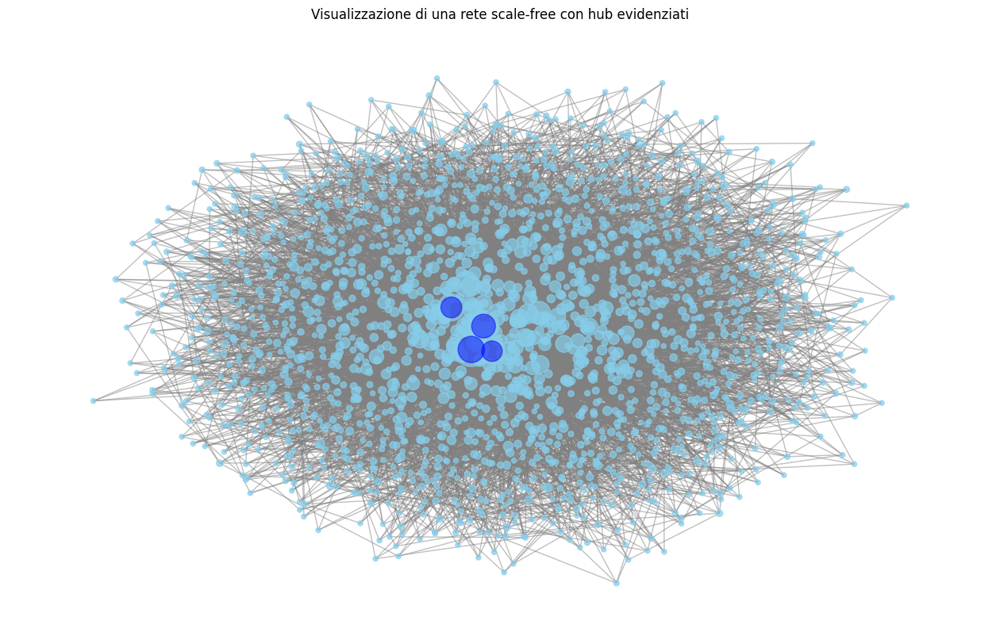

The average degree of the generated network is:  7.984


In [5]:
import numpy as np
import networkx as nx
from scipy.sparse.linalg import eigs

# Function to calculate the maximum eigenvalue of the adjacency matrix
def calculate_max_eigenvalue_sparse(network):
    '''
    Calculates the maximum eigenvalue of the adjacency matrix of the network.
    
    Parameters:
        network: A NetworkX graph.
    
    Returns:
        max_eigenvalue: The maximum eigenvalue of the adjacency matrix of the network.
    '''
    # Step 1: Get the adjacency matrix of the network (in dense format)
    adj_matrix = nx.to_numpy_array(network, dtype=float)  # Convert to a dense numpy array with float type
    
    # Step 2: Use 'eigs' to obtain the maximum eigenvalue (largest in magnitude)
    eigenvalues, _ = eigs(adj_matrix, k=1, which='LR')  # 'LR' finds the eigenvalue with the largest real part
    
    # Step 3: Return the maximum eigenvalue (only the real part)
    max_eigenvalue = np.real(eigenvalues[0])
    
    return max_eigenvalue

# Initializing the parameters of the network
n = 2000  # number of nodes in the scale-free network
m =  4   # number of connections each new node forms



# Apply the Barabási-Albert model to generate an undirected network
network = nx.barabasi_albert_graph(n, m).to_undirected()


# Visualizing the network (assuming you have defined the draw_network function)
draw_network(network)

# Verifying the average degree of the network
print('The average degree of the generated network is: ', np.mean([d for n, d in network.degree()]))



In [6]:
import networkx as nx
import numpy as np

def find_hubs(G):
    # Ottieni i gradi dei nodi
    degrees = dict(G.degree())
    
    # Calcola il grado medio
    avg_degree = np.mean(list(degrees.values()))
    
    # Definisci la soglia per essere considerati hub (e.g., 1.5 volte il grado medio)
    threshold = max(degrees.values()) * 0.6
    
    # Identifica gli hub (nodi con grado maggiore della soglia)
    hubs = {node: degree for node, degree in degrees.items() if degree > threshold}
    print(len(hubs))
    # Stampa gli hub
    print(f"Nodi con grado maggiore di {threshold:.2f} (considerati hub):")
    for node, degree in hubs.items():
        print(f"  Nodo {node}: grado {degree}")
    
    return hubs



# Trova e stampa gli hub
hubs = find_hubs(network)


4
Nodi con grado maggiore di 114.60 (considerati hub):
  Nodo 0: grado 191
  Nodo 5: grado 119
  Nodo 7: grado 155
  Nodo 8: grado 115


## **3. Implementing the dynamics**

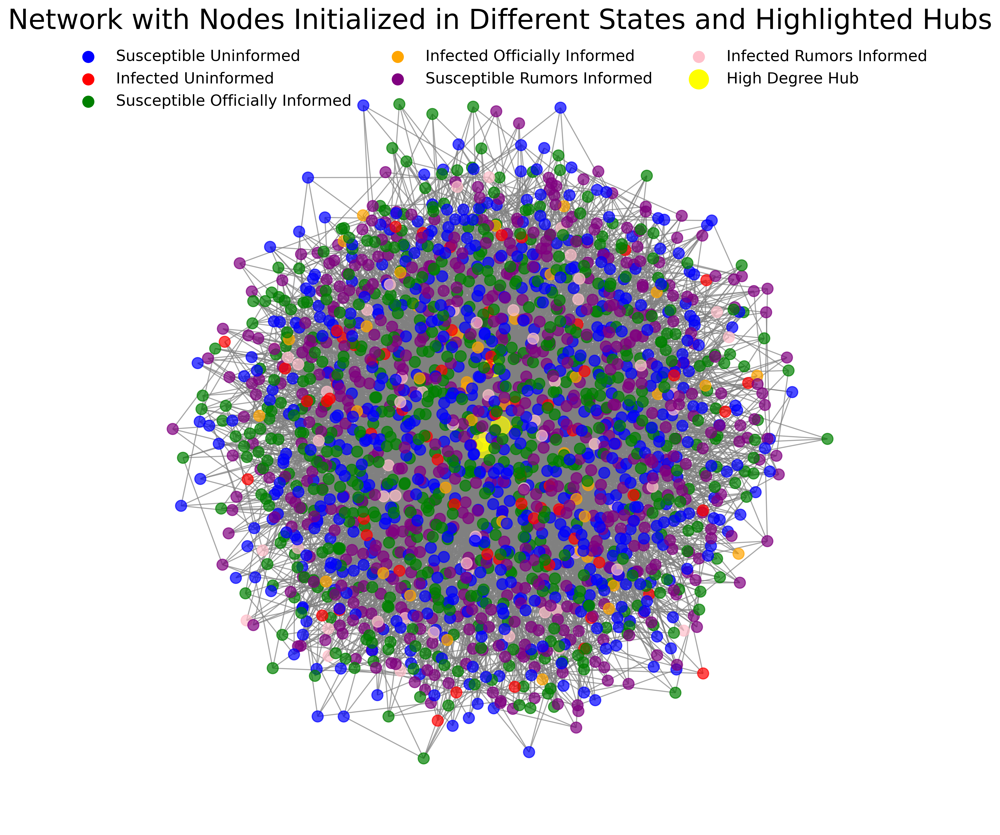

Numero di nodi: 2000
Numero di nodi infetti: 163
Numero di nodi non informati: 673
Numero di nodi informati ufficialmente: 658
Numero di nodi informati tramite rumors: 669


In [29]:
import networkx as nx
import matplotlib.pyplot as plt
import random



# Definizione degli stati possibili
states = ['SU', 'IU', 'SO', 'IO', 'SR', 'IR']
infected_states = ['IU', 'IO', 'IR']
uninformed_states = ['SU', 'IU']
official_states = ['SO', 'IO']
rumors_states = ['SR', 'IR']

# Definisci le probabilità per gli stati
p0 = 0.1  # Probabilità iniziale di infezione
probabilities = [
    (1 - p0) / 3,  # Probabilità per SU
    p0 / 3,        # Probabilità per IU
    (1 - p0) / 3,  # Probabilità per SO
    p0 / 3,        # Probabilità per IO
    (1 - p0) / 3,  # Probabilità per SR
    p0 / 3         # Probabilità per IR
]

# Associa uno stato a ciascun nodo
for node in network.nodes:
    network.nodes[node]['state'] = random.choices(states, weights=probabilities)[0]

degrees = dict(network.degree())
# Definisci i nodi hub (ad esempio, i nodi con grado maggiore di una certa soglia)
hub_threshold = max(degrees.values()) * 0.6  # Definisci una soglia dinamica
hubs = [node for node, degree in degrees.items() if degree > hub_threshold]

# Funzione per disegnare la rete con i nodi colorati in base allo stato e con gli hub evidenziati
def draw_network_with_states_and_hubs(network):
    pos = nx.spring_layout(network, seed=42)  # Layout per i nodi
    
    # Colori per ciascuno stato
    color_map = {
        'SU': 'blue',    # Susceptible Uninformed
        'IU': 'red',     # Infected Uninformed
        'SO': 'green',   # Susceptible Officially Informed
        'IO': 'orange',  # Infected Officially Informed
        'SR': 'purple',  # Susceptible Rumors Informed
        'IR': 'pink'     # Infected Rumors Informed
    }
    
    # Colore e dimensione per gli hub
    hub_color = 'yellow'
    hub_size = 300

    # Ottieni i colori e le dimensioni dei nodi
    node_colors = [hub_color if node in hubs else color_map[network.nodes[node]['state']] for node in network.nodes]
    node_sizes = [hub_size if node in hubs else 100 for node in network.nodes]
    
    plt.figure(figsize=(10, 10), dpi=500)
    
    # Disegna la rete
    nx.draw(network, pos, node_color=node_colors, with_labels=False, 
            node_size=node_sizes, edge_color='gray', alpha=0.7)
    
    # Crea una legenda
    legend_labels = {
        'SU': 'Susceptible Uninformed',
        'IU': 'Infected Uninformed',
        'SO': 'Susceptible Officially Informed',
        'IO': 'Infected Officially Informed',
        'SR': 'Susceptible Rumors Informed',
        'IR': 'Infected Rumors Informed',
        'Hub': 'High Degree Hub'
    }
    
    for state, color in color_map.items():
        plt.scatter([], [], c=color, label=legend_labels[state], s=100)
    
    plt.scatter([], [], c=hub_color, label=legend_labels['Hub'], s=hub_size)
    plt.legend(loc='upper center', ncols=3, frameon=False, fontsize=14)
    
    plt.title("Network with Nodes Initialized in Different States and Highlighted Hubs", fontsize=25)
    plt.axis('off')
    plt.show()

# Esegui la funzione di disegno
draw_network_with_states_and_hubs(network)

# Stampa informazioni sulla rete
print('Numero di nodi:', len(network.nodes))
print('Numero di nodi infetti:', sum(1 for node in network.nodes if network.nodes[node]['state'] in infected_states))
print('Numero di nodi non informati:', sum(1 for node in network.nodes if network.nodes[node]['state'] in uninformed_states))
print('Numero di nodi informati ufficialmente:', sum(1 for node in network.nodes if network.nodes[node]['state'] in official_states))
print('Numero di nodi informati tramite rumors:', sum(1 for node in network.nodes if network.nodes[node]['state'] in rumors_states))


In [8]:
# Stampa lo stato di ciascun hub
print("Stati iniziali degli hub:")
for hub in hubs:
    print(f"Hub {hub} - Grado: {degrees[hub]}, Stato: {network.nodes[hub]['state']}")


Stati iniziali degli hub:
Hub 0 - Grado: 191, Stato: SU
Hub 5 - Grado: 119, Stato: SO
Hub 7 - Grado: 155, Stato: SO
Hub 8 - Grado: 115, Stato: SO


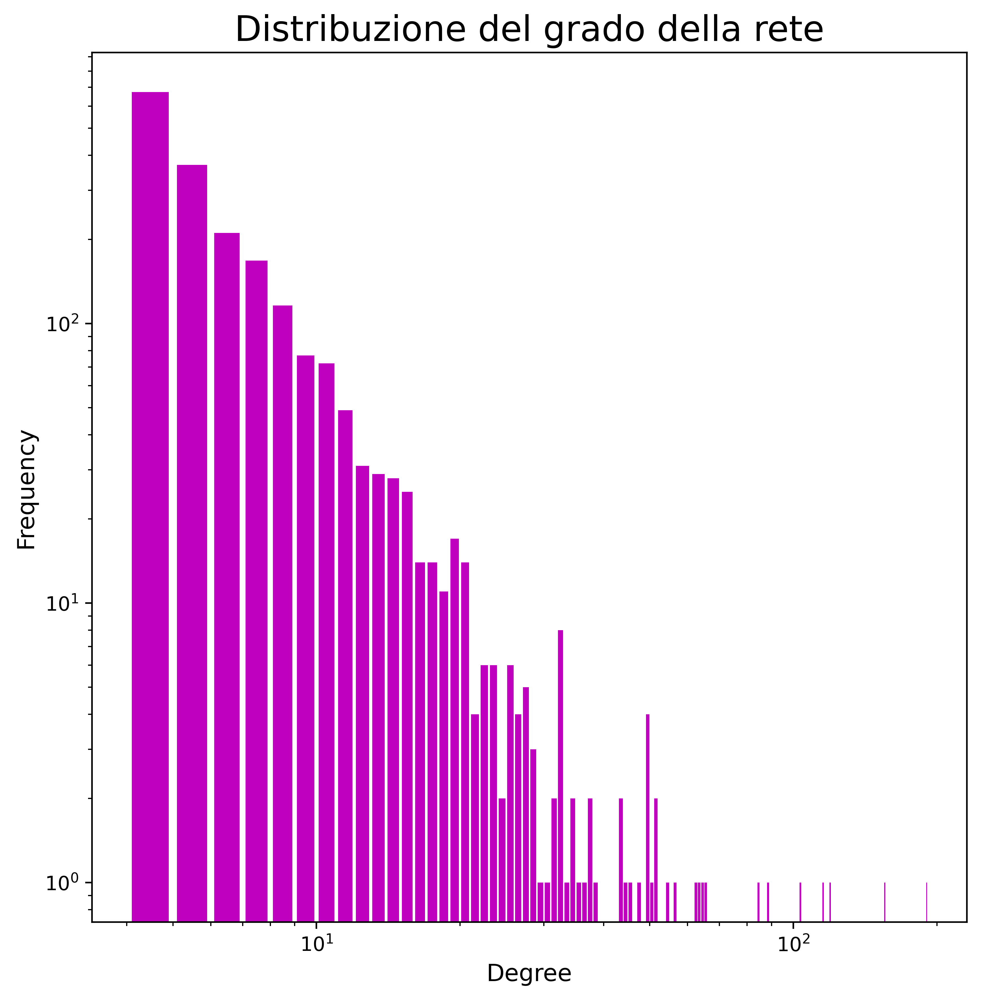

In [20]:
import matplotlib.pyplot as plt

# Ottieni il grado di ciascun nodo
degree_sequence = [degree for node, degree in network.degree()]

plt.figure(figsize=(8, 8), dpi=500)

# Crea un istogramma della distribuzione del grado
plt.hist(degree_sequence, bins=range(min(degree_sequence), max(degree_sequence) + 1), rwidth=0.8, color='m')

# Aggiungi titoli e etichette
plt.title("Distribuzione del grado della rete", fontsize=18)
plt.xlabel("Degree", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.yscale('log')
plt.xscale('log')
# Mostra il grafico
plt.show()


In [10]:
def count_neighbors(neighbors, network):
    ''' 
    function that computes the number of neighbors in each contagious state
    '''
    n_I = 0
    n_U = 0
    n_O = 0
    n_R = 0
    for neighbor in neighbors:
        neighbor_state = network.nodes[neighbor]['state']
        health_state = neighbor_state[0]
        info_state = neighbor_state[-1]
        if (health_state=='I'):
            n_I += 1
        if (info_state=='U'):
            n_U +=1
        if (info_state=='O'):
            n_O += 1
        elif (info_state=='R'):
            n_R +=1
    return n_I,n_U, n_O, n_R

In [11]:
def p_contagion(p, n):
    ''' 
    function that computes the probability, for a specific process, of an individual being contaged
    by at least one of its neighbors
    '''
    return 1- (1-p)**n

In [12]:
def update_node_state(current_state, network, p_S_to_I,corr_for_U, corr_for_O, corr_for_R, p_I_to_S, p_U_to_O, p_U_to_R, p_O_to_U, p_O_to_R, p_R_to_U, p_R_to_O):
    '''  
    function that updates both the health and the information status of a single node
    '''

    # making sure each node has only one state
    if isinstance(current_state, list):
        print(current_state)
        current_state = current_state[0]
        print('node had more than one status')
    # extracting the two current states and the neighbors
    health_state = current_state[0]
    info_state = current_state[-1]
    # and initializing the two new states
    new_health_state = None
    new_info_state = None

    # counting the number of neighbors in contagious statues
    neighbors = network.neighbors(node)
    n_I, n_O, n_U, n_R = count_neighbors(neighbors, network)
    
    # EPIDEMIC STATE
    # adjusting the epidemic spreading rate based on the current information_state
    if (info_state=='U'):
        adj_p_S_to_I = p_S_to_I 
        adj_p_I_to_S = p_I_to_S
    elif (info_state=='O'):
        adj_p_S_to_I = p_S_to_I * corr_for_O
        adj_p_I_to_S = p_I_to_S * corr_for_O
    else:
        adj_p_S_to_I = p_S_to_I * corr_for_R
        adj_p_I_to_S = p_I_to_S * corr_for_R

    if (health_state=='S'):
        if (n_I>0) and (random.random() < p_contagion(adj_p_S_to_I, n_I)): # turning into I depends on the number of I neighbors
            new_health_state = 'I'
            # once I, you cannot be U, so you become O or R based on the neighbours
            # (to ensure only O and R are possible, we need to re-normalize the probs )
            if (n_O>0) and (random.random() < p_contagion(p_U_to_O/(p_U_to_O+p_U_to_R),n_O)):
                new_info_state='O'
            elif (n_R>0) and (random.random()< p_contagion(p_U_to_R/(p_U_to_O+p_U_to_R), n_R)):
                new_info_state='R'
            else: # if there are no opinionated neighbours to based the opinion on
                if (random.random() < p_U_to_O/(p_U_to_O+p_U_to_R)):
                    new_info_state='O'
                else:
                    new_info_state='R'
        else: 
            new_health_state = health_state

        

    if health_state=='I':
        
        if random.random() < adj_p_I_to_S: # recovery is spontaneous
            new_health_state = 'S'
        else:
            new_health_state = health_state
            #new_info_state = 'O'
        
    # INFORMATION STATE
    # if we haven't defined it already based purely on the health state, we compute the new information state
    if (new_info_state==None):
        if (info_state=='U'):
            if (n_O>0) and (random.random() < p_contagion(p_U_to_O, n_O)): # turning into O depends on the number of O neighbors
                new_info_state = 'O' 
            if (n_R>0) and (random.random() < p_contagion(p_U_to_R, n_R)): # turning into R depends on the number of R neighbors
                new_info_state = 'R'
            else:
                new_info_state = info_state
        
        if (info_state=='O'):
            if (n_U>0) and (random.random() < p_contagion(p_O_to_U,n_U)): # forgetting is spontaneous
                new_info_state = 'U'
            if (n_R>0) and (random.random() < p_contagion(p_O_to_R, n_R)): # turning into R depends on the number of R neighbors
                new_info_state = 'R'
            else:
                new_info_state = info_state
            
        if (info_state=='R'):
            if (n_U>0) and (random.random() < p_contagion(p_R_to_U,n_U)): # forgetting is spontaneous
                new_info_state = 'U'
            if (n_O>0) and (random.random() < p_contagion(p_R_to_O, n_O)): # turning into O depends on the number of O neighbors
                new_info_state = 'O'
            else:
                new_info_state = info_state
    
    return new_health_state+new_info_state

In [13]:
def update_network_state_with_infections(network, p_S_to_I, corr_for_U, corr_for_O, corr_for_R, p_I_to_S, p_U_to_O, p_U_to_R, p_O_to_U, p_O_to_R, p_R_to_U, p_R_to_O):
    ''' 
    Funzione che aggiorna lo stato della rete e restituisce anche il numero di nuovi infetti.
    '''
    newly_infected_count = 0  # Conta i nuovi infetti in ogni iterazione
    newly_infected_un=0
    newly_infected_of=0
    newly_infected_ru=0
    previous_states = {node: network.nodes[node]['state'] for node in network.nodes}  # Memorizza lo stato precedente di ogni nodo

    for node in network.nodes:
        current_state = network.nodes[node]['state']
        new_state = update_node_state(current_state, network, p_S_to_I, corr_for_U, corr_for_O, corr_for_R, p_I_to_S, p_U_to_O, p_U_to_R, p_O_to_U, p_O_to_R, p_R_to_U, p_R_to_O)
        network.nodes[node]['state'] = new_state

        # Controlla se il nodo è passato da 'S' (suscettibile) a 'I' (infetto)
        if previous_states[node][0] == 'S' and new_state[0] == 'I':
            newly_infected_count += 1
            if network.nodes[node]['state']=='IU':
                newly_infected_un+=1
            if network.nodes[node]['state']=='IO':
                newly_infected_of+=1
            if network.nodes[node]['state']=='IR':
                newly_infected_ru+=1
                
    infected = sum(1 for node in network.nodes if network.nodes[node]['state'] in infected_states)
    uninformed=sum(1 for node in network.nodes if network.nodes[node]['state'] in uninformed_states)
    official=sum(1 for node in network.nodes if network.nodes[node]['state'] in official_states)
    rumors=sum(1 for node in network.nodes if network.nodes[node]['state'] in rumors_states)
    infected_un=sum(1 for node in network.nodes if network.nodes[node]['state']=='IU')
    infected_of=sum(1 for node in network.nodes if network.nodes[node]['state']=='IO')
    infected_ru=sum(1 for node in network.nodes if network.nodes[node]['state']=='IR')
    
    return network, infected, newly_infected_count, uninformed, official, rumors, infected_un, infected_of, infected_ru, newly_infected_un, newly_infected_of, newly_infected_ru


def evolve_network_with_infections(n_iter, network, p_S_to_I, corr_for_U, corr_for_O, corr_for_R, p_I_to_S, p_U_to_O, p_U_to_R, p_O_to_U, p_O_to_R, p_R_to_U, p_R_to_O):
    ''' 
    Funzione che evolve la rete nel tempo, aggiornando gli stati e registrando i nuovi infetti.
    '''
    newly_infected = np.zeros(n_iter)  # Vettore per memorizzare i nuovi infetti a ogni iterazione
    infected_nodes_set = set()  # Set per memorizzare i nodi infetti almeno una volta
    infected_store=np.zeros(n_iter)
    uninformed_store=np.zeros(n_iter)
    official_store=np.zeros(n_iter)
    rumor_store=np.zeros(n_iter)
    infected_un_store=np.zeros(n_iter)
    infected_of_store=np.zeros(n_iter)
    infected_ru_store=np.zeros(n_iter)
    newly_infected_un_store=np.zeros(n_iter)
    newly_infected_of_store=np.zeros(n_iter)
    newly_infected_ru_store=np.zeros(n_iter)

    
    for i in range(n_iter):
        network, infected, new_infected_count, uninformed, official, rumors, infected_un, infected_of, infected_ru, newly_infected_un, newly_infected_of, newly_infected_ru = update_network_state_with_infections(network, p_S_to_I, corr_for_U, corr_for_O, corr_for_R, p_I_to_S, p_U_to_O, p_U_to_R, p_O_to_U, p_O_to_R, p_R_to_U, p_R_to_O)
        newly_infected[i] = new_infected_count  # Conta solo i nuovi infetti
        infected_store[i]=infected
        uninformed_store[i]=uninformed
        official_store[i]=official
        rumor_store[i]=rumors
        infected_un_store[i]=infected_un
        infected_of_store[i]=infected_of
        infected_ru_store[i]=infected_ru
        newly_infected_un_store[i]=newly_infected_un
        newly_infected_of_store[i]=newly_infected_of
        newly_infected_ru_store[i]=newly_infected_ru
        
        # Aggiorna il set con i nodi che sono diventati infetti in questa iterazione
        for node in network.nodes:
            if network.nodes[node]['state'][0] == 'I':  # Verifica se il nodo è infetto
                infected_nodes_set.add(node)  # Aggiungi il nodo infetto al set

    # Definisci la popolazione totale
    total_population = len(network.nodes)
    
    # Calcola la final attack rate come la proporzione di nodi distinti che sono stati infettati almeno una volta
    final_attack_rate = np.max(infected)
    
    max_newly_infected = np.max(newly_infected)
    
    return network, newly_infected, final_attack_rate, max_newly_infected, infected_store, uninformed_store, official_store, rumor_store, infected_un_store, infected_of_store, infected_ru_store, newly_infected_un_store,newly_infected_of_store,newly_infected_ru_store



In [14]:
def reset_node_states(network, states, p0, seed=None):
    # Imposta il seed per avere risultati riproducibili
    if seed is not None:
        random.seed(seed)
    # Definisci le probabilità per gli stati
    
    probabilities = [
    (1 - p0) / 3,  # Probabilità per SU
    p0 / 3,        # Probabilità per IU
    (1 - p0) / 3,  # Probabilità per SO
    p0 / 3,        # Probabilità per IO
    (1 - p0) / 3,  # Probabilità per SR
    p0 / 3         # Probabilità per IR
    ]
    
    # Reimposta lo stato di ciascun nodo utilizzando le probabilità originali
    for node in network.nodes:
        network.nodes[node]['state'] = random.choices(states, weights=probabilities)[0]
    
    # Conta quanti nodi sono infetti dopo il reset
    #num_infected = sum(1 for node in network.nodes if network.nodes[node]['state'] in infected_states)
    #print('The number of infected nodes at the beginning of the epidemic is ', num_infected)
    #print('the number of uninformed nodes at the beginning of the epidemic is ', sum(1 for node in network.nodes if network.nodes[node]['state'] in uninformed_states))
    #print('the number of official informed nodes at the beginning of the epidemic is ', sum(1 for node in network.nodes if network.nodes[node]['state'] in official_states))
    #print('the number of rumors informed nodes at the beginning of the epidemic is ', sum(1 for node in network.nodes if network.nodes[node]['state'] in rumors_states))

## **4. Parameters Choice**

The choice of parameters values, came from the observation and the experience of Covide-19

In [15]:
# INFORMATION PARAMETERS
# firstly, we define the probabilities that an uninformed will:
# - transition to officially informed
p_U_to_O = 0.55
# - transition to rumor informed
p_U_to_R = 0.35
# - stay informed
#p_U_to_U=0.02
p_U_to_U = 1-p_U_to_R-p_U_to_O

# we also define the probabilities that an officially informed will
# - transition to uninformed
p_O_to_U = 0.45
# - transition to rumor informed
p_O_to_R = 0.45
# - stay officially informed
#p_O_to_O=0.02
p_O_to_O = 1 - p_O_to_U - p_O_to_R

# lastly, we define the probabilities that a rumor informed will
# - transition to uninformed
p_R_to_U = 0.45 # for semplicity for now
# - transition to officially informed
p_R_to_O = 0.45 # for semplicity for now
# - stay rumor informed
#p_R_to_R=0.02
p_R_to_R = 1- p_R_to_U - p_R_to_O

# HEALTH PARAMETERS
# we also define
# - the probability of a susceptible becoming infected (epidemic spreading rate)
p_S_to_I = 0.05
# - the probability of a infected becoming susceptible (recovery rate)
p_I_to_S = p_S_to_I/2.5
# - the correction that needs to the epidemic spreading rate, which is influenced by 
#   the current information state of the nodes
symmetric_correction = 0.3
corr_for_U = 1
corr_for_O = 1-symmetric_correction # needs to be in (0,1]
corr_for_R = 1+symmetric_correction # needs to be in (1, max_val) with arbitrary max_val

Prova a pensare: abbiamo l'informazione che si basa sulla transizione 

In [18]:
import numpy as np
import matplotlib.pyplot as plt

# Define the number of runs for the bootstrap approach
n_runs = 100  # Number of independent simulations
n_iter = 200  # Number of time steps

# Arrays to store results from each simulation
all_newly_infected = np.zeros((n_runs, n_iter))
all_infected_store = np.zeros((n_runs, n_iter))
all_infected_rumor = np.zeros((n_runs, n_iter))
all_infected_uninformed = np.zeros((n_runs, n_iter))
all_infected_informed = np.zeros((n_runs, n_iter))

# Run the simulations
for i in range(n_runs):
    # Reset network state before each run
    reset_node_states(network_try, states, 0.1, seed=1234567 + i)  # Changing seed each run
    
    # Evolve the network and get the results
    _, newly_infected, _, _, infected_store, infected_un_store, infected_of_store, infected_ru_store, *_ = evolve_network_with_infections(
        n_iter, network_try, p_S_to_I, corr_for_U, corr_for_O, corr_for_R,
        p_I_to_S, p_U_to_O, p_U_to_R, p_O_to_U, p_O_to_R, p_R_to_U, p_R_to_O
    )
    
    # Store results in arrays
    all_newly_infected[i, :] = newly_infected
    all_infected_store[i, :] = infected_store
    all_infected_rumor[i, :] = infected_ru_store
    all_infected_uninformed[i, :] = infected_un_store
    all_infected_informed[i, :] = infected_of_store

# Calculate mean and 95% confidence intervals for each time step
mean_newly_infected = np.mean(all_newly_infected, axis=0)
mean_infected_store = np.mean(all_infected_store, axis=0)
mean_infected_rumor = np.mean(all_infected_rumor, axis=0)
mean_infected_uninformed = np.mean(all_infected_uninformed, axis=0)
mean_infected_informed = np.mean(all_infected_informed, axis=0)

# 95% confidence interval: mean ± 1.96 * standard error
ci_newly_infected = 1.96 * np.std(all_newly_infected, axis=0) / np.sqrt(n_runs)
ci_infected_store = 1.96 * np.std(all_infected_store, axis=0) / np.sqrt(n_runs)
ci_infected_rumor = 1.96 * np.std(all_infected_rumor, axis=0) / np.sqrt(n_runs)
ci_infected_uninformed = 1.96 * np.std(all_infected_uninformed, axis=0) / np.sqrt(n_runs)
ci_infected_informed = 1.96 * np.std(all_infected_informed, axis=0) / np.sqrt(n_runs)

# Plotting with confidence intervals
plt.figure(figsize=(10, 12))

# Plot for newly infected
plt.subplot(3, 1, 1)
plt.plot(mean_newly_infected, label='Mean Newly Infected')
plt.fill_between(range(n_iter),
                 mean_newly_infected - ci_newly_infected,
                 mean_newly_infected + ci_newly_infected,
                 color='b', alpha=0.2, label='95% Confidence Interval')
plt.xlabel('Time Step')
plt.ylabel('Newly Infected Nodes')
plt.title('Newly Infected Nodes Over Time')
plt.legend()

# Plot for total infected
plt.subplot(3, 1, 2)
plt.plot(mean_infected_store, label='Mean Infected Nodes')
plt.fill_between(range(n_iter),
                 mean_infected_store - ci_infected_store,
                 mean_infected_store + ci_infected_store,
                 color='r', alpha=0.2, label='95% Confidence Interval')
plt.xlabel('Time Step')
plt.ylabel('Total Infected Nodes')
plt.title('Total Infected Nodes Over Time')
plt.legend()

# Plot for infected rumor, uninformed, and informed
plt.subplot(3, 1, 3)
plt.plot(mean_infected_rumor, label='Mean Infected Rumor', color='purple')
plt.fill_between(range(n_iter),
                 mean_infected_rumor - ci_infected_rumor,
                 mean_infected_rumor + ci_infected_rumor,
                 color='purple', alpha=0.2)

plt.plot(mean_infected_uninformed, label='Mean Infected Uninformed', color='green')
plt.fill_between(range(n_iter),
                 mean_infected_uninformed - ci_infected_uninformed,
                 mean_infected_uninformed + ci_infected_uninformed,
                 color='green', alpha=0.2)

plt.plot(mean_infected_informed, label='Mean Infected Informed', color='orange')
plt.fill_between(range(n_iter),
                 mean_infected_informed - ci_infected_informed,
                 mean_infected_informed + ci_infected_informed,
                 color='orange', alpha=0.2)

plt.xlabel('Time Step')
plt.ylabel('Infected Subgroups')
plt.title('Infected Rumor, Uninformed, and Informed Over Time')
plt.legend()

plt.tight_layout()
plt.show()


KeyboardInterrupt: 

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import networkx as nx
import matplotlib.patches as mpatches

# Numero di iterazioni e setup iniziale della rete
n_iter = 200
reset_node_states(network_try, states, 0.3, seed=1234567)
network_states_over_time = []

# Evoluzione della rete e registrazione degli stati
for t in range(n_iter):
    # Appendi una copia dello stato corrente della rete
    network_states_over_time.append(nx.get_node_attributes(network_try, 'state').copy())
    
    # Esegui un passo temporale dell'evoluzione
    network_try, newly_infected, final_attack_rate, max_newly_infected, infected_store, uninformed_store, official_store, rumor_store, infected_un_store, infected_of_store, infected_ru_store, newly_infected_un_store, newly_infected_of_store, newly_infected_ru_store = evolve_network_with_infections(
        1, network_try, p_S_to_I, corr_for_U, corr_for_O, corr_for_R, p_I_to_S, p_U_to_O, p_U_to_R, p_O_to_U, p_O_to_R, p_R_to_U, p_R_to_O
    )

# Imposta il layout per i nodi della rete
pos = nx.spring_layout(network_try)

# Colori degli stati per la legenda
color_map = {
    'SU': 'blue',    # Susceptible Uninformed
    'IU': 'red',     # Infected Uninformed
    'SO': 'green',   # Susceptible Officially Informed
    'IO': 'orange',  # Infected Officially Informed
    'SR': 'purple',  # Susceptible Rumor Informed
    'IR': 'yellow'   # Infected Rumor Informed
}

# Definisce le etichette della legenda
legend_patches = [mpatches.Patch(color=color, label=state) for state, color in color_map.items()]

# Funzione di aggiornamento per l'animazione
def update(frame):
    plt.clf()
    # Colori per i nodi in base allo stato attuale
    node_colors = [color_map[network_states_over_time[frame][node]] for node in network_try.nodes]
    nx.draw(network_try, pos, node_color=node_colors, with_labels=False, node_size=100, alpha=0.6)
    plt.title(f"Network State at Iteration {frame + 1}")
    plt.legend(handles=legend_patches, loc="upper right")  # Aggiunge la legenda

# Creazione dell'animazione
fig = plt.figure(figsize=(12, 8))
ani = animation.FuncAnimation(fig, update, frames=n_iter, repeat=False)

# Salva l'animazione come file mp4
ani.save('network_evolution.mp4', writer='ffmpeg', fps=10)

# Visualizza l'animazione
plt.show()


## cambiamo la connettività mantenendo i parametri costanti

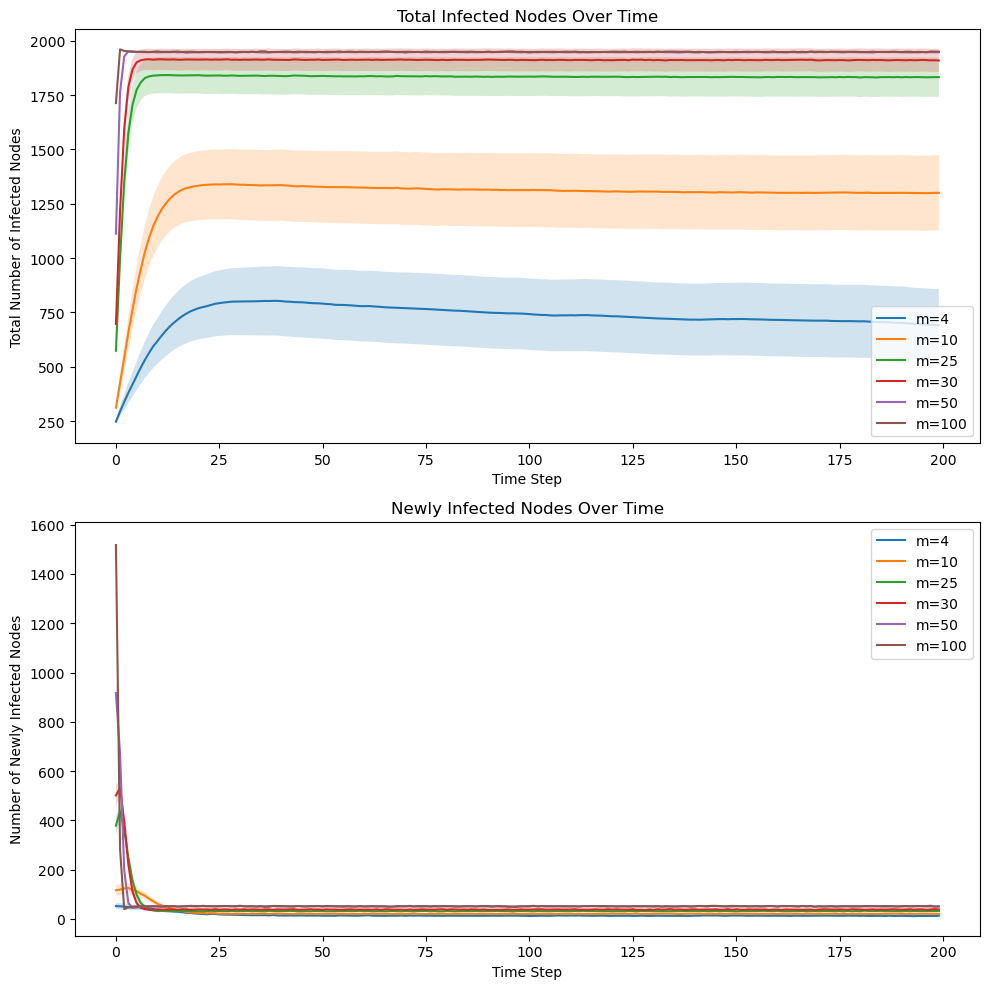

In [92]:
import numpy as np
import matplotlib.pyplot as plt
from joblib import Parallel, delayed
import networkx as nx

# Common parameters
n = 2000  # Number of nodes
m_values = [4, 10, 25, 30, 50, 100]  # Different m values for each network
n_iter = 200  # Number of time steps
n_runs = 100  # Number of runs for each m value
seed_gen=1234
# Function to execute a single simulation and return results
def simulate_network(m, seed_offset):
    # Create the network
    network_gen = nx.barabasi_albert_graph(n, m).to_undirected()
    
    # Reset node states
    reset_node_states(network_gen, states, 0.1, seed=seed_gen + seed_offset)
    
    # Run the simulation
    _, newly_infected, _, _, infected_store, *_ = evolve_network_with_infections(
        n_iter, network_gen, p_S_to_I, corr_for_U, corr_for_O, corr_for_R,
        p_I_to_S, p_U_to_O, p_U_to_R, p_O_to_U, p_O_to_R, p_R_to_U, p_R_to_O
    )
    return newly_infected, infected_store

# Dictionary to store results for each m value
results_dict = {}

# Run simulations for each m value with parallel processing
for m in m_values:
    # Run multiple simulations for the current m
    simulations = Parallel(n_jobs=-1)(delayed(simulate_network)(m, i) for i in range(n_runs))
    
    # Collect results into arrays
    newly_infected_runs = np.array([sim[0] for sim in simulations])
    infected_store_runs = np.array([sim[1] for sim in simulations])
    
    # Calculate mean and 95% confidence intervals
    mean_newly_infected = np.mean(newly_infected_runs, axis=0)
    ci_newly_infected = 1.96 * np.std(newly_infected_runs, axis=0) / np.sqrt(n_runs)
    
    mean_infected_store = np.mean(infected_store_runs, axis=0)
    ci_infected_store = 1.96 * np.std(infected_store_runs, axis=0) / np.sqrt(n_runs)
    
    # Store results in the dictionary
    results_dict[m] = (mean_newly_infected, ci_newly_infected, mean_infected_store, ci_infected_store)

# Plotting
fig, axes = plt.subplots(2, 1, figsize=(10, 10))

# Plot for Newly Infected
for m, (mean_newly_infected, ci_newly_infected, _, _) in results_dict.items():
    axes[1].plot(mean_newly_infected, label=f'm={m}')
    axes[1].fill_between(range(n_iter),
                         mean_newly_infected - ci_newly_infected,
                         mean_newly_infected + ci_newly_infected,
                         alpha=0.2)
axes[1].set_title("Newly Infected Nodes Over Time")
axes[1].set_xlabel("Time Step")
axes[1].set_ylabel("Number of Newly Infected Nodes")
axes[1].legend()

# Plot for Total Infected
for m, (_, _, mean_infected_store, ci_infected_store) in results_dict.items():
    axes[0].plot(mean_infected_store, label=f'm={m}')
    axes[0].fill_between(range(n_iter),
                         mean_infected_store - ci_infected_store,
                         mean_infected_store + ci_infected_store,
                         alpha=0.2)
axes[0].set_title("Total Infected Nodes Over Time")
axes[0].set_xlabel("Time Step")
axes[0].set_ylabel("Total Number of Infected Nodes")
axes[0].legend()

plt.tight_layout()
plt.show()


In [97]:
# Calculate densities of Officially Informed and Rumor Informed nodes
num_nodes = len(network_try.nodes)
num_uninformed=sum(1 for node in network_try.nodes if network_try.nodes[node]['state'] in ['IU','SU'])
num_officially_informed = sum(1 for node in network_try.nodes if network_try.nodes[node]['state'] in ['IO', 'SO'])
num_rumor_informed = sum(1 for node in network_try.nodes if network_try.nodes[node]['state'] in ['IR', 'SR'])

density_uninformed=num_uninformed/num_nodes
density_officially_informed = num_officially_informed / num_nodes
density_rumor_informed = num_rumor_informed / num_nodes

# Print the densities
print(f"Uninformed:{density_uninformed:.8f}")
print(f"Officially Informed: {density_officially_informed:.8f}")
print(f"Rumor Informed: {density_rumor_informed:.8f}")

Uninformed:0.00000000
Officially Informed: 0.00000000
Rumor Informed: 1.00000000


Quando abbiamo una situazione endemica -> la malattia sopravvive, abbiamo sostanzialmente che la densità finae degli official informed è nulla, bisogna capire il perchè.

# Variazione dei parametri


Simulazioni completate: 100%|███████████████████| 30/30 [00:03<00:00,  7.97it/s]


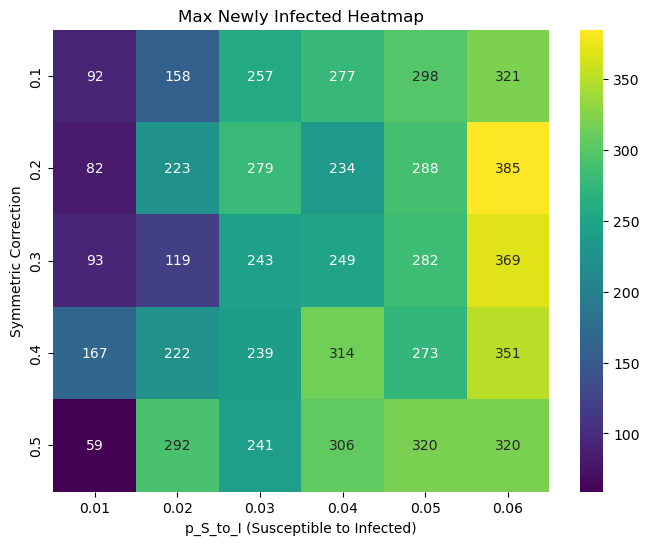

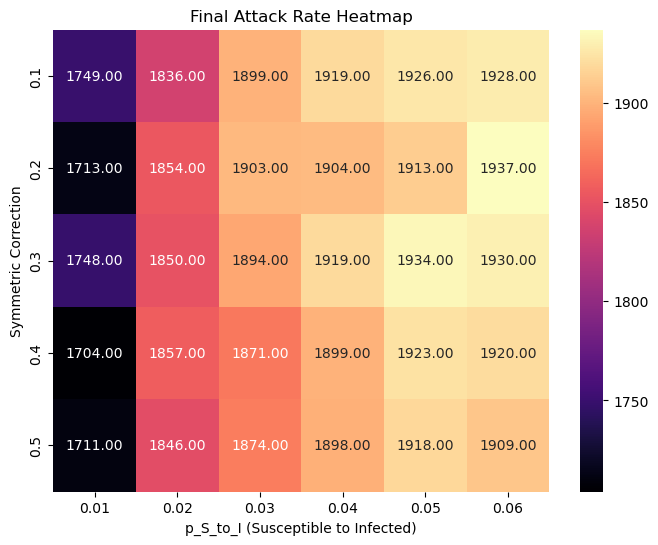

In [106]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import product
from joblib import Parallel, delayed
from tqdm import tqdm

# Definizione dei parametri fissi

# Definizione dei parametri variabili
p_S_to_I_vals = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06]  # probabilità di transizione da suscettibile a infetto
symmetric_correction_vals = [0.1, 0.2, 0.3, 0.4, 0.5]  # correzione simmetrica per rumor/official information

# Altri parametri
p_U_to_O = 0.25  # probabilità che un uninformed diventi ufficialmente informato
p_U_to_R = 0.2   # probabilità che un uninformed diventi rumor informed
p_O_to_R = 0.04  # probabilità che un informed passi a rumor
p_O_to_U = 0.04  # probabilità che un official informed torni uninformed
p_O_to_O = 0.02  # probabilità di rimanere official informed

p_R_to_U = 0.4  # probabilità che un rumor informed torni uninformed
p_R_to_O = 0.4  # probabilità che un rumor informed diventi officially informed
p_R_to_R = 0.02  # probabilità di rimanere rumor informed

p_I_to_S = 0.02  # probabilità di guarigione di un infetto

n_iter = 200  # Numero di iterazioni della simulazione

# Funzione che esegue la simulazione con parametri dati
def run_simulation(network, params):
    # Scompatta i parametri
    p_S_to_I, symmetric_correction = params
    
    # Calcola le correzioni per rumor e official in base alla symmetry correction
    corr_for_U = 1
    corr_for_O = 1 - symmetric_correction  # correzione per informazione ufficiale
    corr_for_R = 1 + symmetric_correction  # correzione per informazione da rumor
    
    # Reset dello stato dei nodi (funzione da implementare)
    reset_node_states(network, states, 0.1, seed=12345)
    
    # Evolve la rete con il modello SIS/informazione (funzione da implementare)
    network, newly_infected, final_attack_rate, max_newly_infected, infected_store, uninformed_store, \
    official_store, rumor_store, infected_un_store, infected_of_store, infected_ru_store, \
    newly_infected_un_store, newly_infected_of_store, newly_infected_ru_store = evolve_network_with_infections(
        n_iter, network, p_S_to_I, corr_for_U, corr_for_O, corr_for_R, p_I_to_S, 
        p_U_to_O, p_U_to_R, p_O_to_U, p_O_to_R, p_R_to_U, p_R_to_O)
    
    # Restituisci i parametri che variano, il numero massimo di infetti e il final attack rate
    return (p_S_to_I, symmetric_correction, max_newly_infected, final_attack_rate)

# Crea tutte le combinazioni di p_S_to_I e symmetric_correction
param_combinations = list(product(p_S_to_I_vals, symmetric_correction_vals))

n=2000
m=15
network_try = nx.barabasi_albert_graph(n, m).to_undirected()

# Parallelizza le simulazioni e mostra una barra di avanzamento
results = Parallel(n_jobs=-1)(
    delayed(run_simulation)(network_try, params) for params in tqdm(param_combinations, desc="Simulazioni completate")
)

# Estrai i valori di p_S_to_I, symmetric_correction, max_newly_infected e final_attack_rate per le heatmap
p_S_to_I_vals = sorted(list(set([res[0] for res in results])))
symmetric_correction_vals = sorted(list(set([res[1] for res in results])))

# Crea matrici per le heatmap
heatmap_max_newly_infected = np.zeros((len(symmetric_correction_vals), len(p_S_to_I_vals)))
heatmap_final_attack_rate = np.zeros((len(symmetric_correction_vals), len(p_S_to_I_vals)))

# Riempie le matrici con i valori di max_newly_infected e final_attack_rate
for res in results:
    p_S_to_I, symmetric_correction, max_newly_infected, final_attack_rate = res
    i = symmetric_correction_vals.index(symmetric_correction)
    j = p_S_to_I_vals.index(p_S_to_I)
    heatmap_max_newly_infected[i, j] = max_newly_infected
    heatmap_final_attack_rate[i, j] = final_attack_rate

# Crea la heatmap per max_newly_infected
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_max_newly_infected, xticklabels=p_S_to_I_vals, yticklabels=symmetric_correction_vals, cmap='viridis', annot=True, fmt='0.0f')
plt.xlabel('p_S_to_I (Susceptible to Infected)')
plt.ylabel('Symmetric Correction')
plt.title('Max Newly Infected Heatmap')
plt.show()

# Crea la heatmap per final attack rate
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_final_attack_rate, xticklabels=p_S_to_I_vals, yticklabels=symmetric_correction_vals, cmap='magma', annot=True, fmt='.2f')
plt.xlabel('p_S_to_I (Susceptible to Infected)')
plt.ylabel('Symmetric Correction')
plt.title('Final Attack Rate Heatmap')
plt.show()


## SIMMETRY CORRECTION

In [134]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import product
from joblib import Parallel, delayed
from tqdm import tqdm
import networkx as nx

# Definizione dei parametri fissi
n = 2000  # Numero di nodi per la rete
m_values = [4, 10,20, 25, 30, 50, 100]  # Valori diversi di m per la connettività

# Definizione dei parametri variabili
p_S_to_I_vals = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06]  # probabilità di transizione da suscettibile a infetto
symmetric_correction_vals = [0.1, 0.2, 0.3, 0.4, 0.5]  # correzione simmetrica per rumor/official information

# Altri parametri (stessi come nel tuo codice)
p_U_to_O = 0.25
p_U_to_R = 0.2
p_O_to_R = 0.04
p_O_to_U = 0.04
p_O_to_O = 0.02
p_R_to_U = 0.4
p_R_to_O = 0.4
p_R_to_R = 0.02
p_I_to_S = 0.02
n_iter = 200  # Numero di iterazioni della simulazione

# Funzione che esegue la simulazione con parametri dati
def run_simulation(network, params):
    p_S_to_I, symmetric_correction = params
    
    # Calcola le correzioni per rumor e official
    corr_for_U = 1
    corr_for_O = 1 - symmetric_correction
    corr_for_R = 1 + symmetric_correction
    
    # Reset dello stato dei nodi
    reset_node_states(network, states, 0.1, seed=1234567)
    
    # Evolve la rete
    network, newly_infected, final_attack_rate, max_newly_infected, infected_store, uninformed_store, \
    official_store, rumor_store, infected_un_store, infected_of_store, infected_ru_store, \
    newly_infected_un_store, newly_infected_of_store, newly_infected_ru_store = evolve_network_with_infections(
        n_iter, network, p_S_to_I, corr_for_U, corr_for_O, corr_for_R, p_I_to_S, 
        p_U_to_O, p_U_to_R, p_O_to_U, p_O_to_R, p_R_to_U, p_R_to_O)
    
    return (p_S_to_I, symmetric_correction, max_newly_infected, final_attack_rate)

# Crea tutte le combinazioni di p_S_to_I e symmetric_correction
param_combinations = list(product(p_S_to_I_vals, symmetric_correction_vals))

# Inizializza le matrici per i risultati
heatmap_max_newly_infected = np.zeros((len(symmetric_correction_vals), len(p_S_to_I_vals), len(m_values)))
heatmap_final_attack_rate = np.zeros((len(symmetric_correction_vals), len(p_S_to_I_vals), len(m_values)))

# Parallelizza le simulazioni su diverse reti
for idx, m_ in enumerate(m_values):
    # Crea la rete Barabási-Albert per ciascun valore di m
    network = nx.barabasi_albert_graph(n, m_).to_undirected()
    
    # Parallelizza le simulazioni
    results = Parallel(n_jobs=-1)(
        delayed(run_simulation)(network, params) for params in tqdm(param_combinations, desc=f"Completed Simulations for m={m_}")
    )
    
    # Riempie le matrici con i risultati
    for res in results:
        p_S_to_I, symmetric_correction, max_newly_infected, final_attack_rate = res
        i = symmetric_correction_vals.index(symmetric_correction)
        j = p_S_to_I_vals.index(p_S_to_I)
        heatmap_max_newly_infected[i, j, idx] = max_newly_infected
        heatmap_final_attack_rate[i, j, idx] = final_attack_rate





Completed Simulations for m=4: 100%|████████████| 30/30 [00:02<00:00, 14.98it/s]

Completed Simulations for m=10: 100%|███████████| 30/30 [00:02<00:00, 10.06it/s]

Completed Simulations for m=20: 100%|███████████| 30/30 [00:04<00:00,  7.01it/s]

Completed Simulations for m=25: 100%|███████████| 30/30 [00:04<00:00,  6.14it/s]

Completed Simulations for m=30: 100%|███████████| 30/30 [00:05<00:00,  5.34it/s]

Completed Simulations for m=50: 100%|███████████| 30/30 [00:08<00:00,  3.59it/s]

Completed Simulations for m=100: 100%|██████████| 30/30 [00:15<00:00,  1.92it/s]


In [135]:
print(enumerate(m_values))


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Parametri per i grafici
figsize = (50, 150)
fontsize = 50
annot_fontsize=50
n_cols = 2  # Numero di colonne per riga
n_rows = 7  # Numero di righe

# Heatmap per max_newly_infected
plt.figure(figsize=figsize)
for idx, m in enumerate(m_values):
    ax = plt.subplot(n_rows, n_cols, idx + 1)
    heatmap=sns.heatmap(heatmap_max_newly_infected[:, :, idx], xticklabels=p_S_to_I_vals, yticklabels=symmetric_correction_vals,
                cmap='viridis', annot=True, fmt='0.0f', annot_kws={"size": annot_fontsize},cbar_kws={"shrink": 0.8, "orientation": "vertical"})
    ax.set_title(f'Max Newly Infected (m={m})', fontsize=fontsize+2)
    ax.set_xlabel('p_S_to_I', fontsize=fontsize)
    ax.set_ylabel('Symmetric Correction', fontsize=fontsize)
    ax.tick_params(axis='x', labelrotation=45, labelsize=fontsize-1)
    ax.tick_params(axis='y', labelsize=fontsize-1)
    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=50)
plt.tight_layout()
plt.show()

# Heatmap per final attack rate
plt.figure(figsize=figsize)
for idx, m in enumerate(m_values):
    ax = plt.subplot(n_rows, n_cols, idx + 1)
    heatmap=sns.heatmap(heatmap_final_attack_rate[:, :, idx], xticklabels=p_S_to_I_vals, yticklabels=symmetric_correction_vals,
                cmap='magma', annot=True, fmt='.0f', annot_kws={"size": annot_fontsize},cbar_kws={"shrink": 0.8, "orientation": "vertical"})
    ax.set_title(f'Final Attack Rate (m={m})', fontsize=fontsize+2)
    ax.set_xlabel('p_S_to_I', fontsize=fontsize)
    ax.set_ylabel('Symmetric Correction', fontsize=fontsize)
    ax.tick_params(axis='x', labelrotation=45, labelsize=fontsize-1)
    ax.tick_params(axis='y', labelsize=fontsize-1)
    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=50)
plt.tight_layout()
plt.show()


## P_U_TO_R

In [141]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import product
from joblib import Parallel, delayed
from tqdm import tqdm
import networkx as nx

# Definizione dei parametri fissi
n = 2000  # Numero di nodi per la rete
m_values = [4, 10, 25, 30, 50, 100]  # Valori diversi di m per la connettività

# Definizione dei parametri variabili
p_S_to_I_vals = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06]  # probabilità di transizione da suscettibile a infetto
p_U_to_R_vals= [0.1, 0.2, 0.3, 0.4, 0.5]  # correzione simmetrica per rumor/official information

# Altri parametri (stessi come nel tuo codice)
p_U_to_O = 0.25
simmetry_correction = 0.5
p_O_to_R = 0.04
p_O_to_U = 0.04
p_O_to_O = 0.02
p_R_to_U = 0.4
p_R_to_O = 0.4
p_R_to_R = 0.02
p_I_to_S = 0.02
n_iter = 200  # Numero di iterazioni della simulazione

# Funzione che esegue la simulazione con parametri dati
def run_simulation(network, params):
    p_S_to_I, p_U_to_R = params
    
    # Calcola le correzioni per rumor e official
    corr_for_U = 1
    corr_for_O = 1 - symmetric_correction
    corr_for_R = 1 + symmetric_correction
    
    # Reset dello stato dei nodi
    reset_node_states(network, states, 0.1, seed=1234567)
    
    # Evolve la rete
    network, newly_infected, final_attack_rate, max_newly_infected, infected_store, uninformed_store, \
    official_store, rumor_store, infected_un_store, infected_of_store, infected_ru_store, \
    newly_infected_un_store, newly_infected_of_store, newly_infected_ru_store = evolve_network_with_infections(
        n_iter, network, p_S_to_I, corr_for_U, corr_for_O, corr_for_R, p_I_to_S, 
        p_U_to_O, p_U_to_R, p_O_to_U, p_O_to_R, p_R_to_U, p_R_to_O)
    
    return (p_S_to_I, p_U_to_R, max_newly_infected, final_attack_rate)

# Crea tutte le combinazioni di p_S_to_I e symmetric_correction
param_combinations = list(product(p_S_to_I_vals, symmetric_correction_vals))

# Inizializza le matrici per i risultati
heatmap_max_newly_infected_ = np.zeros((len(p_U_to_R_vals), len(p_S_to_I_vals), len(m_values)))
heatmap_final_attack_rate_ = np.zeros((len(p_U_to_R_vals), len(p_S_to_I_vals), len(m_values)))

# Parallelizza le simulazioni su diverse reti
for idx, m_ in enumerate(m_values):
    # Crea la rete Barabási-Albert per ciascun valore di m
    network = nx.barabasi_albert_graph(n, m_).to_undirected()
    
    # Parallelizza le simulazioni
    results = Parallel(n_jobs=-1)(
        delayed(run_simulation)(network, params) for params in tqdm(param_combinations, desc=f"Completed simulations for m={m_}")
    )
    
    # Riempie le matrici con i risultati
    for res in results:
        p_S_to_I, p_U_to_R, max_newly_infected, final_attack_rate = res
        i = p_U_to_R_vals.index(p_U_to_R)
        j = p_S_to_I_vals.index(p_S_to_I)
        heatmap_max_newly_infected_[i, j, idx] = max_newly_infected
        heatmap_final_attack_rate_[i, j, idx] = final_attack_rate





Completed simulations for m=4: 100%|████████████| 30/30 [00:02<00:00, 14.28it/s]

Completed simulations for m=10: 100%|███████████| 30/30 [00:02<00:00, 10.85it/s]

Completed simulations for m=25: 100%|███████████| 30/30 [00:04<00:00,  6.26it/s]

Completed simulations for m=30: 100%|███████████| 30/30 [00:05<00:00,  5.22it/s]

Completed simulations for m=50: 100%|███████████| 30/30 [00:08<00:00,  3.63it/s]

Completed simulations for m=100: 100%|██████████| 30/30 [00:15<00:00,  1.91it/s]


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Parametri per i grafici
figsize = (50, 150)
fontsize = 50
annot_fontsize=50
n_cols = 2  # Numero di colonne per riga
n_rows = 6  # Numero di righe

# Heatmap per max_newly_infected
plt.figure(figsize=figsize)
for idx, m in enumerate(m_values):
    ax = plt.subplot(n_rows, n_cols, idx + 1)
    heatmap=sns.heatmap(heatmap_max_newly_infected_[:, :, idx], xticklabels=p_S_to_I_vals, yticklabels=p_U_to_R_vals,
                cmap='viridis', annot=True, fmt='0.0f', annot_kws={"size": annot_fontsize},cbar_kws={"shrink": 0.8, "orientation": "vertical"})
    ax.set_title(f'Max Newly Infected (m={m})', fontsize=fontsize+2)
    ax.set_xlabel('p_S_to_I', fontsize=fontsize)
    ax.set_ylabel('p_U_to_R', fontsize=fontsize)
    ax.tick_params(axis='x', labelrotation=45, labelsize=fontsize-1)
    ax.tick_params(axis='y', labelsize=fontsize-1)
    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=50)
plt.tight_layout()
plt.show()

# Heatmap per final attack rate
plt.figure(figsize=figsize)
for idx, m in enumerate(m_values):
    ax = plt.subplot(n_rows, n_cols, idx + 1)
    heatmap=sns.heatmap(heatmap_final_attack_rate_[:, :, idx], xticklabels=p_S_to_I_vals, yticklabels=p_U_to_R_vals,
                cmap='magma', annot=True, fmt='.0f', annot_kws={"size": annot_fontsize},cbar_kws={"shrink": 0.8, "orientation": "vertical"})
    ax.set_title(f'Final Attack Rate (m={m})', fontsize=fontsize+2)
    ax.set_xlabel('p_S_to_I', fontsize=fontsize)
    ax.set_ylabel('p_U_to_R', fontsize=fontsize)
    ax.tick_params(axis='x', labelrotation=45, labelsize=fontsize-1)
    ax.tick_params(axis='y', labelsize=fontsize-1)
    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=50)
plt.tight_layout()
plt.show()


Aggiungere commenti su cosa sta succedendo e fare un po' di story telling

---

## Cambiamo l'inizializazione e vediamo cosa succede se infettiamo solo gli hub

In [147]:
# we define a function to help us fisualize the network
import networkx as nx
import matplotlib.pyplot as plt

def draw_network(G):
    '''  
    Funzione per visualizzare la rete usando l'algoritmo force-directed Fruchterman-Reingold
    e mettere in evidenza gli hub (nodi con grado elevato).
    '''
    plt.figure(figsize=(16, 10))
    
    # Calcola la posizione dei nodi con layout force-directed
    pos = nx.spring_layout(G)
    
    # Identifica il grado di ciascun nodo
    degrees = dict(G.degree())
    
    # Definisci i nodi hub (ad esempio, i nodi con grado maggiore di una certa soglia)
    hub_threshold = max(degrees.values()) * 0.6  # Definisci una soglia dinamica
    hubs = [node for node, degree in degrees.items() if degree > hub_threshold]
    
    # Disegna tutti i nodi, con dimensioni proporzionali al grado
    node_size = [degrees[node] * 5 for node in G.nodes()]
    nx.draw_networkx_nodes(G, pos, node_size=node_size, node_color='skyblue', alpha=0.7)
    
    # Disegna gli hub con un colore diverso
    nx.draw_networkx_nodes(G, pos, nodelist=hubs, node_size=[degrees[node] * 3 for node in hubs], node_color='blue',alpha=0.5)
    
    # Disegna i collegamenti tra i nodi
    nx.draw_networkx_edges(G, pos, edge_color='gray', alpha=0.5)
    
    # Titolo del grafico
    plt.title("Visualizzazione di una rete scale-free con hub evidenziati")
    plt.axis('off')  # Nasconde gli assi
    plt.show()




In [149]:
def average_degree(network):
    ''' 
    function that computes the average degree of the network
    '''
    num_edges=network.number_of_edges()
    #sum_of_degrees = sum(dict(network.degree()).values())
    n_nodes = network.number_of_nodes()
    return 2*num_edges/n_nodes

In [ ]:
import numpy as np
import networkx as nx

# Initializing the parameters of the network
n = 2000  # number of nodes in the scale-free network
m =  15  # number of connections each new node forms



# Apply the Barabási-Albert model to generate an undirected network
network_hubs = nx.barabasi_albert_graph(n, m).to_undirected()


# Visualizing the network (assuming you have defined the draw_network function)
draw_network(network_hubs)

# Verifying the average degree of the network
print('The average degree of the generated network is: ', np.mean([d for n, d in network_hubs.degree()]))



In [152]:
import networkx as nx
import numpy as np

def find_hubs(G):
    # Ottieni i gradi dei nodi
    degrees = dict(G.degree())
    
    # Calcola il grado medio
    avg_degree = np.mean(list(degrees.values()))
    
    # Definisci la soglia per essere considerati hub (e.g., 1.5 volte il grado medio)
    threshold = max(degrees.values()) * 0.6
    
    # Identifica gli hub (nodi con grado maggiore della soglia)
    hubs = {node: degree for node, degree in degrees.items() if degree > threshold}
    print(len(hubs))
    # Stampa gli hub
    print(f"Nodi con grado maggiore di {threshold:.2f} (considerati hub):")
    for node, degree in hubs.items():
        print(f"  Nodo {node}: grado {degree}")
    
    return hubs



# Trova e stampa gli hub
hubs = find_hubs(network_hubs)


11
Nodi con grado maggiore di 201.60 (considerati hub):
  Nodo 0: grado 282
  Nodo 16: grado 336
  Nodo 17: grado 295
  Nodo 18: grado 254
  Nodo 19: grado 224
  Nodo 20: grado 313
  Nodo 22: grado 209
  Nodo 23: grado 239
  Nodo 24: grado 235
  Nodo 25: grado 204
  Nodo 30: grado 206


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import random

# Imposta il seme per il generatore casuale
#seed_value = 123456789  # Scegli un valore di seme qualsiasi
#random.seed(seed_value)

# Definizione degli stati possibili
states = ['SU', 'IU', 'SO', 'IO', 'SR', 'IR']
infected_states = ['IU', 'IO', 'IR']
uninformed_states = ['SU', 'IU']
official_states = ['SO', 'IO']
rumors_states = ['SR', 'IR']

# Definisci la probabilità iniziale di infezione per gli hub
p_infected_hub = 0.7  # Probabilità di infezione per gli hub
p_infected_non_hub = 0.1  # Probabilità di infezione per i nodi non hub

# Calcola il grado dei nodi
degrees = dict(network_hubs.degree())
hub_threshold = max(degrees.values()) * 0.6  # Soglia per definire un nodo come hub
hubs = [node for node, degree in degrees.items() if degree > hub_threshold]

# Inizializza gli stati dei nodi
for node in network_hubs.nodes:
    if node in hubs:
        # Se il nodo è un hub, assegna una probabilità di infezione più alta
        probabilities_hubs = [
            0,  # SU
            0,        # IU
            0,  # SO
            0,        # IO
            0 ,  # SR
            1          # IR
        ]
    else:
        # Se il nodo non è un hub, assegna una probabilità di infezione più bassa
        probabilities_hubs = [
            1/3,  # SU
            0.0/3,        # IU
            1/3,  # SO
            0.0/3,        # IO
            1/3,  # SR
            0.0/3        # IR
        ]
    
    # Assegna lo stato al nodo in base alle probabilità
    network_hubs.nodes[node]['state'] = random.choices(states, weights=probabilities_hubs)[0]

# Funzione per disegnare la rete con i nodi colorati in base allo stato e con gli hub evidenziati
def draw_network_with_states_and_hubs(network):
    pos = nx.spring_layout(network, seed=42)  # Layout per i nodi
    
    # Colori per ciascuno stato
    color_map = {
        'SU': 'blue',    # Susceptible Uninformed
        'IU': 'red',     # Infected Uninformed
        'SO': 'green',   # Susceptible Officially Informed
        'IO': 'orange',  # Infected Officially Informed
        'SR': 'purple',  # Susceptible Rumors Informed
        'IR': 'pink'     # Infected Rumors Informed
    }
    
    # Colore e dimensione per gli hub
    hub_color = 'yellow'
    hub_size = 300

    # Ottieni i colori e le dimensioni dei nodi
    node_colors = [hub_color if node in hubs else color_map[network.nodes[node]['state']] for node in network.nodes]
    node_sizes = [hub_size if node in hubs else 100 for node in network.nodes]
    
    plt.figure(figsize=(16, 10))
    
    # Disegna la rete
    nx.draw(network, pos, node_color=node_colors, with_labels=False, 
            node_size=node_sizes, edge_color='gray', alpha=0.7)
    
    # Crea una legenda
    legend_labels = {
        'SU': 'Susceptible Uninformed',
        'IU': 'Infected Uninformed',
        'SO': 'Susceptible Officially Informed',
        'IO': 'Infected Officially Informed',
        'SR': 'Susceptible Rumors Informed',
        'IR': 'Infected Rumors Informed',
        'Hub': 'High Degree Hub'
    }
    
    for state, color in color_map.items():
        plt.scatter([], [], c=color, label=legend_labels[state], s=100)
    
    plt.scatter([], [], c=hub_color, label=legend_labels['Hub'], s=hub_size)
    plt.legend(loc='best', fontsize='small', frameon=False)
    
    plt.title("Network with Nodes Initialized in Different States and Highlighted Hubs", fontsize=16)
    plt.axis('off')
    plt.show()

# Esegui la funzione di disegno
draw_network_with_states_and_hubs(network_hubs)

# Stampa informazioni sulla rete
print('Numero di nodi:', len(network_hubs.nodes))
print('Numero di nodi infetti:', sum(1 for node in network_hubs.nodes if network_hubs.nodes[node]['state'] in infected_states))
print('Numero di nodi non informati:', sum(1 for node in network_hubs.nodes if network_hubs.nodes[node]['state'] in uninformed_states))
print('Numero di nodi informati ufficialmente:', sum(1 for node in network_hubs.nodes if network_hubs.nodes[node]['state'] in official_states))
print('Numero di nodi informati tramite rumors:', sum(1 for node in network_hubs.nodes if network_hubs.nodes[node]['state'] in rumors_states))


In [154]:
def initialize_node_states_hubs(network, states, seed=None):
    # Imposta il seed per avere risultati riproducibili
    if seed is not None:
        random.seed(seed)
    
    # Inizializza gli stati dei nodi
    for node in network.nodes:
        if node in hubs:
            # Se il nodo è un hub, assegna una probabilità di infezione più alta
            probabilities = [
            0,  # SU
            1 / 3,        # IU
            0,  # SO
            1/ 3,        # IO
            0 ,  # SR
            1 / 3         # IR
            ]
        else:
            # Se il nodo non è un hub, assegna una probabilità di infezione più bassa
            probabilities = [
            1/ 3,  # SU
            0,        # IU
            1/3,  # SO
            0,        # IO
            1/3,  # SR
            0         # IR
            ]
    
    # Assegna lo stato al nodo in base alle probabilità
    network.nodes[node]['state'] = random.choices(states, weights=probabilities)[0]

    
    # Conta quanti nodi sono infetti dopo il reset
    #num_infected = sum(1 for node in network.nodes if network.nodes[node]['state'] in infected_states)
    #print('The number of infected nodes at the beginning of the epidemic is ', num_infected)
    #print('the number of uninformed nodes at the beginning of the epidemic is ', sum(1 for node in network.nodes if network.nodes[node]['state'] in uninformed_states))
    #print('the number of official informed nodes at the beginning of the epidemic is ', sum(1 for node in network.nodes if network.nodes[node]['state'] in official_states))
    #print('the number of rumors informed nodes at the beginning of the epidemic is ', sum(1 for node in network.nodes if network.nodes[node]['state'] in rumors_states))

In [155]:
# INFORMATION PARAMETERS
# firstly, we define the probabilities that an uninformed will:
# - transition to officially informed
p_U_to_O = 0.04
# - transition to rumor informed
p_U_to_R = 0.02
# - stay informed
p_U_to_U=0.02
#p_U_to_U = 1-p_U_to_R-p_U_to_O

# we also define the probabilities that an officially informed will
# - transition to uninformed
p_O_to_U = 0.04
# - transition to rumor informed
p_O_to_R = 0.04
# - stay officially informed
p_O_to_O=0.02
#p_O_to_O = 1 - p_O_to_U - p_O_to_R

# lastly, we define the probabilities that a rumor informed will
# - transition to uninformed
p_R_to_U = 0.4 # for semplicity for now
# - transition to officially informed
p_R_to_O = 0.4 # for semplicity for now
# - stay rumor informed
p_R_to_R=0.02
#p_R_to_R = 1- p_R_to_U - p_R_to_O

# HEALTH PARAMETERS
# we also define
# - the probability of a susceptible becoming infected (epidemic spreading rate)
p_S_to_I = 0.05
# - the probability of a infected becoming susceptible (recovery rate)
p_I_to_S = p_S_to_I/2.5
# - the correction that needs to the epidemic spreading rate, which is influenced by 
#   the current information state of the nodes
symmetric_correction = 0.3
corr_for_U = 1
corr_for_O = 1-symmetric_correction # needs to be in (0,1]
corr_for_R = 1+symmetric_correction # needs to be in (1, max_val) with arbitrary max_val

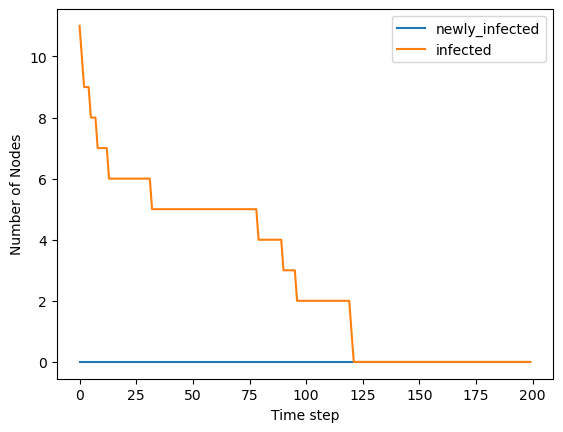

In [156]:
n_iter=200
initialize_node_states_hubs(network_hubs, states,seed=12345)
network_hubs, newly_infected, final_attack_rate, max_newly_infected, infected_store, uninformed_store, official_store, rumor_store, infected_un_store, infected_of_store, infected_ru_store, newly_infected_un_store,newly_infected_of_store,newly_infected_ru_store = evolve_network_with_infections(n_iter, network_hubs, p_S_to_I, corr_for_U, corr_for_O, corr_for_R, p_I_to_S, p_U_to_O, p_U_to_R, p_O_to_U, p_O_to_R, p_R_to_U, p_R_to_O)
#plt.figure(figsize=(10, 10))
plt.plot(newly_infected,label='newly_infected')
plt.plot(infected_store,label='infected')
plt.xlabel('Time step')
plt.ylabel('Number of Nodes')
plt.legend()

se infettiamo solo gli hubs l'epidemia non parte, anche se gli mettiamo i rumors

---

### potremmo guardare qual è la densità minima di infetti per avere la pandemia: 0,1

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import random

# Initializing the parameters of the network
n = 2000  # number of nodes in the scale-free network
m =  15   # number of connections each new node forms



# Apply the Barabási-Albert model to generate an undirected network
network = nx.barabasi_albert_graph(n, m).to_undirected()

# Definizione degli stati possibili
states = ['SU', 'IU', 'SO', 'IO', 'SR', 'IR']
infected_states = ['IU', 'IO', 'IR']
uninformed_states = ['SU', 'IU']
official_states = ['SO', 'IO']
rumors_states = ['SR', 'IR']

# Definisci le probabilità per gli stati
p0 = 0.008  # Probabilità iniziale di infezione
probabilities = [
    (1 - p0) / 3,  # Probabilità per SU
    p0 / 3,        # Probabilità per IU
    (1 - p0) / 3,  # Probabilità per SO
    p0 / 3,        # Probabilità per IO
    (1 - p0) / 3,  # Probabilità per SR
    p0 / 3         # Probabilità per IR
]

# Associa uno stato a ciascun nodo
for node in network.nodes:
    network.nodes[node]['state'] = random.choices(states, weights=probabilities)[0]

degrees = dict(network.degree())
# Definisci i nodi hub (ad esempio, i nodi con grado maggiore di una certa soglia)
hub_threshold = max(degrees.values()) * 0.6  # Definisci una soglia dinamica
hubs = [node for node, degree in degrees.items() if degree > hub_threshold]

# Funzione per disegnare la rete con i nodi colorati in base allo stato e con gli hub evidenziati
def draw_network_with_states_and_hubs(network):
    pos = nx.spring_layout(network, seed=42)  # Layout per i nodi
    
    # Colori per ciascuno stato
    color_map = {
        'SU': 'blue',    # Susceptible Uninformed
        'IU': 'red',     # Infected Uninformed
        'SO': 'green',   # Susceptible Officially Informed
        'IO': 'orange',  # Infected Officially Informed
        'SR': 'purple',  # Susceptible Rumors Informed
        'IR': 'pink'     # Infected Rumors Informed
    }
    
    # Colore e dimensione per gli hub
    hub_color = 'yellow'
    hub_size = 300

    # Ottieni i colori e le dimensioni dei nodi
    node_colors = [hub_color if node in hubs else color_map[network.nodes[node]['state']] for node in network.nodes]
    node_sizes = [hub_size if node in hubs else 100 for node in network.nodes]
    
    plt.figure(figsize=(16, 10))
    
    # Disegna la rete
    nx.draw(network, pos, node_color=node_colors, with_labels=False, 
            node_size=node_sizes, edge_color='gray', alpha=0.7)
    
    # Crea una legenda
    legend_labels = {
        'SU': 'Susceptible Uninformed',
        'IU': 'Infected Uninformed',
        'SO': 'Susceptible Officially Informed',
        'IO': 'Infected Officially Informed',
        'SR': 'Susceptible Rumors Informed',
        'IR': 'Infected Rumors Informed',
        'Hub': 'High Degree Hub'
    }
    
    for state, color in color_map.items():
        plt.scatter([], [], c=color, label=legend_labels[state], s=100)
    
    plt.scatter([], [], c=hub_color, label=legend_labels['Hub'], s=hub_size)
    plt.legend(loc='best', fontsize='small', frameon=False)
    
    plt.title("Network with Nodes Initialized in Different States and Highlighted Hubs", fontsize=16)
    plt.axis('off')
    plt.show()

# Esegui la funzione di disegno
# draw_network_with_states_and_hubs(network)

# Stampa informazioni sulla rete
print('Numero di nodi:', len(network.nodes))
print('Numero di nodi infetti:', sum(1 for node in network.nodes if network.nodes[node]['state'] in infected_states))
print('Numero di nodi non informati:', sum(1 for node in network.nodes if network.nodes[node]['state'] in uninformed_states))
print('Numero di nodi informati ufficialmente:', sum(1 for node in network.nodes if network.nodes[node]['state'] in official_states))
print('Numero di nodi informati tramite rumors:', sum(1 for node in network.nodes if network.nodes[node]['state'] in rumors_states))


In [164]:
def reset_node_states_news(network, states, p0, infected_states, seed=None):
    # Imposta il seed per avere risultati riproducibili
    if seed is not None:
        random.seed(seed)
    # Definisci le probabilità per gli stati
    
    probabilities = [
    (1 - p0) / 3,  # Probabilità per SU
    p0 / 3,        # Probabilità per IU
    (1 - p0) / 3,  # Probabilità per SO
    p0 / 3,        # Probabilità per IO
    (1 - p0) / 3,  # Probabilità per SR
    p0 / 3         # Probabilità per IR
    ]
    
    # Reimposta lo stato di ciascun nodo utilizzando le probabilità originali
    for node in network.nodes:
        network.nodes[node]['state'] = random.choices(states, weights=probabilities)[0]
    
    # Conta quanti nodi sono infetti dopo il reset
    #num_infected = sum(1 for node in network.nodes if network.nodes[node]['state'] in infected_states)
    #print('The number of infected nodes at the beginning of the epidemic is ', num_infected)
    #print('the number of uninformed nodes at the beginning of the epidemic is ', sum(1 for node in network.nodes if network.nodes[node]['state'] in uninformed_states))
    #print('the number of official informed nodes at the beginning of the epidemic is ', sum(1 for node in network.nodes if network.nodes[node]['state'] in official_states))
    #print('the number of rumors informed nodes at the beginning of the epidemic is ', sum(1 for node in network.nodes if network.nodes[node]['state'] in rumors_states))

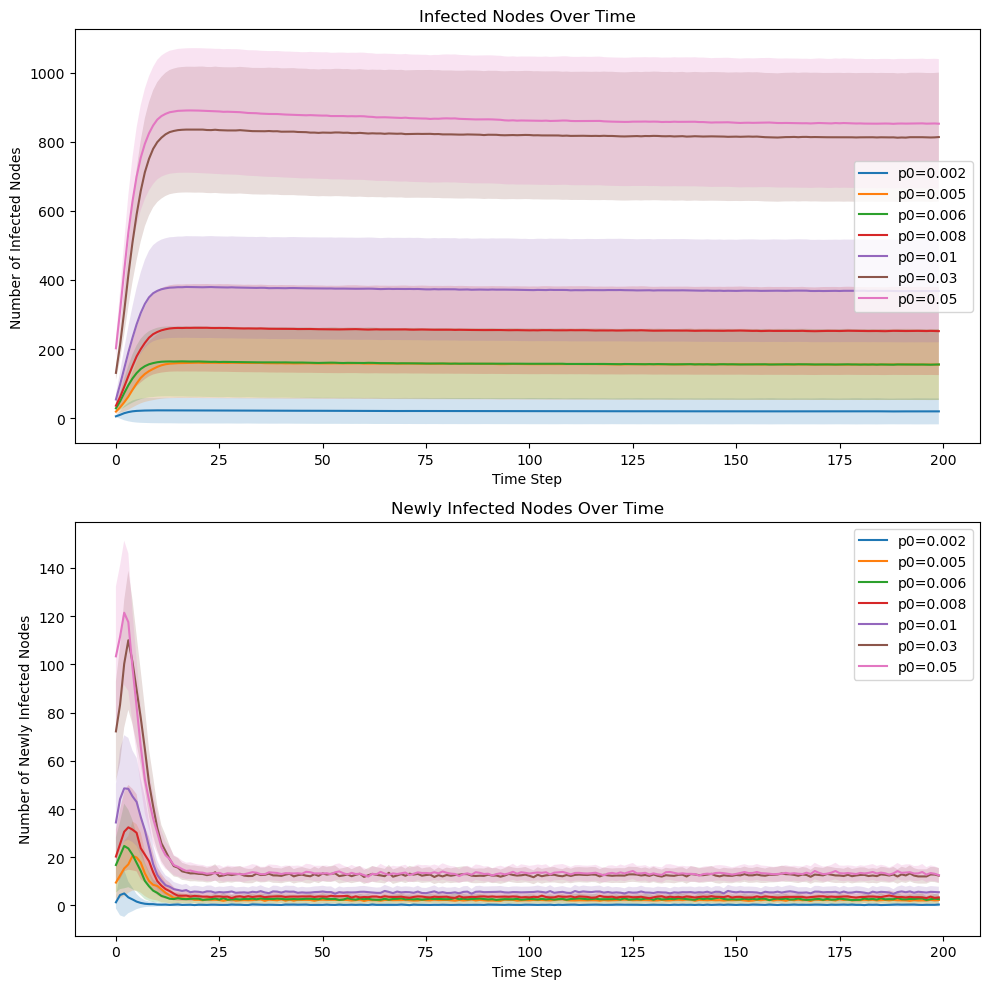

In [165]:
import numpy as np
import matplotlib.pyplot as plt
from joblib import Parallel, delayed
import networkx as nx

# Common parameters
n = 2000  # Number of nodes
m = 15    # Value of m for each network
n_iter = 200  # Number of iterations
n_runs = 100  # Number of runs per p0 value
seed_gen = 12345678  # Seed for reproducibility

# Define possible states
states = ['SU', 'IU', 'SO', 'IO', 'SR', 'IR']
infected_states = ['IU', 'IO', 'IR']

# Define initial infection probabilities
p0_vals = [0.002, 0.005, 0.006, 0.008, 0.01, 0.03, 0.05]

# Function to execute a single simulation and return results
def simulate_network(p0, n, m, seed_offset):
    # Create the network
    network_inf = nx.barabasi_albert_graph(n, m).to_undirected()
    
    # Reset node states
    reset_node_states_news(network_inf, states, p0, infected_states, seed=seed_gen + seed_offset)
    
    # Run the infection spread simulation
    _, newly_infected, _, _, infected_store, *_ = evolve_network_with_infections(
        n_iter, network_inf, p_S_to_I, corr_for_U, corr_for_O, corr_for_R,
        p_I_to_S, p_U_to_O, p_U_to_R, p_O_to_U, p_O_to_R, p_R_to_U, p_R_to_O
    )
    return newly_infected, infected_store

# Dictionary to store results for each p0 value
results_dict = {}

# Run simulations for each p0 value in parallel
for p0 in p0_vals:
    # Run multiple simulations for the current p0
    simulations = Parallel(n_jobs=-1)(delayed(simulate_network)(p0, n, m, i) for i in range(n_runs))
    
    # Collect results into arrays
    newly_infected_runs = np.array([sim[0] for sim in simulations])
    infected_store_runs = np.array([sim[1] for sim in simulations])
    
    # Calculate mean and 95% confidence intervals
    mean_newly_infected = np.mean(newly_infected_runs, axis=0)
    ci_newly_infected = 1.96 * np.std(newly_infected_runs, axis=0) / np.sqrt(n_runs)
    
    mean_infected_store = np.mean(infected_store_runs, axis=0)
    ci_infected_store = 1.96 * np.std(infected_store_runs, axis=0) / np.sqrt(n_runs)
    
    # Store results in the dictionary
    results_dict[p0] = (mean_infected_store, ci_infected_store, mean_newly_infected, ci_newly_infected)

# Plotting
fig, axes = plt.subplots(2, 1, figsize=(10, 10))

# Plot for Infected Nodes Over Time
for p0, (mean_infected_store, ci_infected_store, _, _) in results_dict.items():
    axes[0].plot(mean_infected_store, label=f'p0={p0}')
    axes[0].fill_between(range(n_iter),
                         mean_infected_store - ci_infected_store,
                         mean_infected_store + ci_infected_store,
                         alpha=0.2)
axes[0].set_title("Infected Nodes Over Time")
axes[0].set_xlabel("Time Step")
#axes[0].set_xlim(-1, 25)
axes[0].set_ylabel("Number of Infected Nodes")
axes[0].legend()

# Plot for Newly Infected Nodes Over Time
for p0, (_, _, mean_newly_infected, ci_newly_infected) in results_dict.items():
    axes[1].plot(mean_newly_infected, label=f'p0={p0}')
    axes[1].fill_between(range(n_iter),
                         mean_newly_infected - ci_newly_infected,
                         mean_newly_infected + ci_newly_infected,
                         alpha=0.2)
axes[1].set_title("Newly Infected Nodes Over Time")
axes[1].set_xlabel("Time Step")
axes[1].set_ylabel("Number of Newly Infected Nodes")
#axes[1].set_xlim(-1, 25)
axes[1].legend()

plt.tight_layout()
plt.show()


---
#### Adesso vediamo cosa succede cambiando le inizializzazioni per le notizie

In [167]:
def reset_node_states_news(network, states, balance_O=0.5, infected_states=None, seed=None):
    # Imposta il seed per avere risultati riproducibili
    if seed is not None:
        random.seed(seed)
    
    # Parametro di probabilità iniziale
    p0 = 0.1
    
    # Calcola automaticamente balance_U e balance_R in modo che la somma sia 1
    balance_U = (1 - balance_O) / 2
    balance_R = (1 - balance_O) / 2

    # Verifica che la somma dei parametri di bilanciamento sia 1
    assert np.isclose(balance_U + balance_O + balance_R, 1), "La somma dei parametri di bilanciamento deve essere 1"
    
    # Calcolo delle probabilità in base al bilanciamento e a p0
    probabilities = [
        (1 - p0) * balance_U,     # Probabilità per SU
        p0 * balance_U,           # Probabilità per IU
        (1 - p0) * balance_O,     # Probabilità per SO
        p0 * balance_O,           # Probabilità per IO
        (1 - p0) * balance_R,     # Probabilità per SR
        p0 * balance_R            # Probabilità per IR
    ]
    
    # Reimposta lo stato di ciascun nodo utilizzando le probabilità originali
    for node in network.nodes:
        network.nodes[node]['state'] = random.choices(states, weights=probabilities)[0]


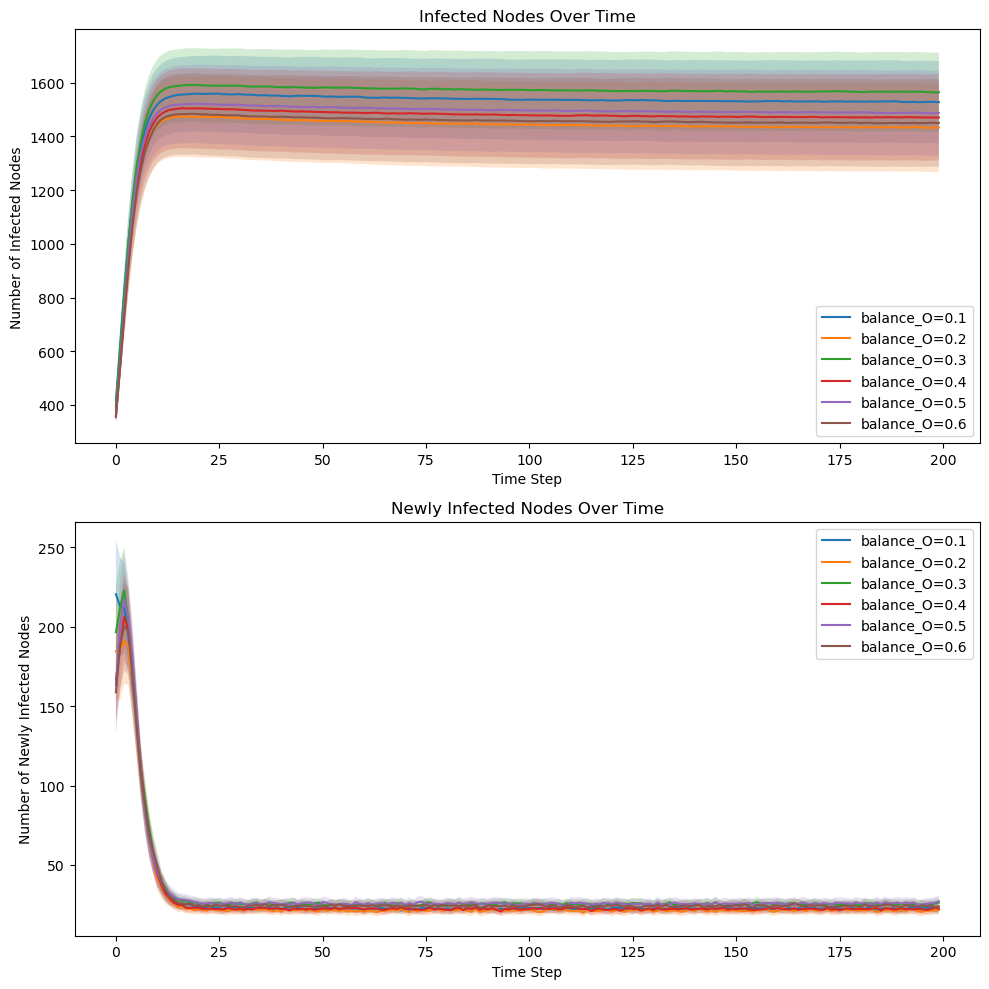

In [168]:
import numpy as np
import matplotlib.pyplot as plt
from joblib import Parallel, delayed
import networkx as nx

# Common parameters
n = 2000  # Number of nodes
m = 15    # Value of m for each network
n_iter = 200  # Number of iterations
n_runs = 100  # Number of runs per p0 value
seed_gen = 12345678  # Seed for reproducibility

# Define possible states
states = ['SU', 'IU', 'SO', 'IO', 'SR', 'IR']
infected_states = ['IU', 'IO', 'IR']

# Define initial infection probabilities
balance_O_vals = [0.1,0.2,0.3,0.4,0.5,0.6]

# Function to execute a single simulation and return results
def simulate_network(balance_O, n, m, seed_offset):
    # Create the network
    network_inf = nx.barabasi_albert_graph(n, m).to_undirected()
    
    # Reset node states
    reset_node_states_news(network_inf, states,  balance_O,  infected_states, seed=seed_gen + seed_offset)
    
    # Run the infection spread simulation
    _, newly_infected, _, _, infected_store, *_ = evolve_network_with_infections(
        n_iter, network_inf, p_S_to_I, corr_for_U, corr_for_O, corr_for_R,
        p_I_to_S, p_U_to_O, p_U_to_R, p_O_to_U, p_O_to_R, p_R_to_U, p_R_to_O
    )
    return newly_infected, infected_store

# Dictionary to store results for each p0 value
results_dict = {}

# Run simulations for each p0 value in parallel
for balance_O in balance_O_vals:
    # Run multiple simulations for the current p0
    simulations = Parallel(n_jobs=-1)(delayed(simulate_network)(balance_O, n, m, i) for i in range(n_runs))
    
    # Collect results into arrays
    newly_infected_runs = np.array([sim[0] for sim in simulations])
    infected_store_runs = np.array([sim[1] for sim in simulations])
    
    # Calculate mean and 95% confidence intervals
    mean_newly_infected = np.mean(newly_infected_runs, axis=0)
    ci_newly_infected = 1.96 * np.std(newly_infected_runs, axis=0) / np.sqrt(n_runs)
    
    mean_infected_store = np.mean(infected_store_runs, axis=0)
    ci_infected_store = 1.96 * np.std(infected_store_runs, axis=0) / np.sqrt(n_runs)
    
    # Store results in the dictionary
    results_dict[balance_O] = (mean_infected_store, ci_infected_store, mean_newly_infected, ci_newly_infected)

# Plotting
fig, axes = plt.subplots(2, 1, figsize=(10, 10))

# Plot for Infected Nodes Over Time
for balance_O, (mean_infected_store, ci_infected_store, _, _) in results_dict.items():
    axes[0].plot(mean_infected_store, label=f'balance_O={balance_O}')
    axes[0].fill_between(range(n_iter),
                         mean_infected_store - ci_infected_store,
                         mean_infected_store + ci_infected_store,
                         alpha=0.2)
axes[0].set_title("Infected Nodes Over Time")
axes[0].set_xlabel("Time Step")
#axes[0].set_xlim(-1, 25)
axes[0].set_ylabel("Number of Infected Nodes")
axes[0].legend()

# Plot for Newly Infected Nodes Over Time
for balance_O, (_, _, mean_newly_infected, ci_newly_infected) in results_dict.items():
    axes[1].plot(mean_newly_infected, label=f'balance_O={balance_O}')
    axes[1].fill_between(range(n_iter),
                         mean_newly_infected - ci_newly_infected,
                         mean_newly_infected + ci_newly_infected,
                         alpha=0.2)
axes[1].set_title("Newly Infected Nodes Over Time")
axes[1].set_xlabel("Time Step")
axes[1].set_ylabel("Number of Newly Infected Nodes")
#axes[1].set_xlim(-1, 25)
axes[1].legend()

plt.tight_layout()
plt.show()
